In [ ]:
using_colab = True

if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())

    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    # Downloading the SAM 2 model checkpoint
    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

In [ ]:
# Downloading Video Data
!gdown 1FxeRZZz1wPPQokRO_UoQg3ia9eSxiP4m # test v2
!unzip test_video_frames_09.zip -d test_video_frames_v6

!gdown 1i1L41S_v8-IyX_iQY5AycA-M_KgTZfci # test v1
!unzip /content/test_video_frames.zip -d /content/extracted_frames

# yolo11s best model
!gdown 1A6_iThtWBlzgvGqOP9QXuDYGFL809jYL

# test v1의 원본 비디오 (test video 01)
!gdown 1iGlgjmaozb878yLH8iBYaArJSnad1YKN

In [ ]:
!pip install supervision
!pip install ultralytics

## Imports

In [ ]:
import os
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"

import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from pathlib import Path

from sam2.build_sam import build_sam2
from sam2.build_sam import build_sam2_video_predictor

import supervision as sv
from moviepy.editor import VideoFileClip
import moviepy.editor as mp

from ultralytics import YOLO

In [ ]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

In [8]:
# 기본 함수
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

In [32]:
# 세그멘테이션 마스크에서 광고판 꼭짓점 좌표 추출
def get_billboard_corners(mask):
    if mask is None or mask.size == 0:
        raise ValueError("ERROR: mask가 None이거나 빈 배열입니다.")

    if len(mask.shape) != 2:
        mask = np.squeeze(mask)  # 2D로 변환

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) == 0:
        raise ValueError("ERROR: Contours를 찾을 수 없습니다.")

    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:1]

    corners = None
    for contour in contours:
        epsilon = 0.02 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)

        if len(approx) >= 4:
            corners = approx.reshape(-1, 2)
            break

    if corners is None or len(corners) < 4:
        raise ValueError("ERROR: 유효한 4개의 꼭짓점을 찾을 수 없습니다.")

    return corners.astype(np.float32)


# 광고판 꼭짓점 정렬 함수(코너기반 정렬)
def order_corners(corners):
    center = np.mean(corners, axis=0)
    def sort_key(point):
        dx, dy = point - center
        return np.arctan2(dy, dx)
    sorted_corners = sorted(corners, key=sort_key)

    return np.array(sorted_corners, dtype=np.float32)


# 광고판의 정면 가로 세로 길이 계산 (유클리드 거리)
def calculate_billboard_size_video(corners):
    if corners is None or len(corners) < 4:
        raise ValueError("ERROR: 유효한 꼭짓점 4개를 찾지 못했습니다.")

    pts_src = order_corners(corners).astype(np.float32)

    # 가로 세로 길이 계산
    width_top = np.linalg.norm(pts_src[1] - pts_src[0])
    width_bottom = np.linalg.norm(pts_src[2] - pts_src[3])
    real_width = max(width_top, width_bottom)

    height_left = np.linalg.norm(pts_src[3] - pts_src[0])
    height_right = np.linalg.norm(pts_src[2] - pts_src[1])
    real_height = max(height_left, height_right)

    return pts_src, real_width, real_height


def insert_new_billboard(frame, pts_src, new_ad, mask, alpha=0.9):

    # 광고 이미지 크기 결정
    real_width = int(np.linalg.norm(pts_src[1] - pts_src[0]))
    real_height = int(np.linalg.norm(pts_src[3] - pts_src[0]))

    resized_ad = cv2.resize(new_ad, (real_width, real_height)) # 광고 이미지 리사이징

    # 원근 변환 (정면 -> 실제 위치)
    pts_dst = np.array([
        [0, 0], [real_width, 0],
        [real_width, real_height], [0, real_height]
    ], dtype=np.float32)
    M_inverse = cv2.getPerspectiveTransform(pts_dst, pts_src)
    warped_ad = cv2.warpPerspective(
        resized_ad, M_inverse,
        (frame.shape[1], frame.shape[0]),
        flags=cv2.INTER_CUBIC,
        borderMode=cv2.BORDER_REFLECT
    )

    # mask > 0 영역만 알파 블랜딩
    blended = frame.copy()
    mask_bool = mask > 0

    for c in range(3):
        blended[:, :, c][mask_bool] = (
            alpha * warped_ad[:, :, c][mask_bool] +
            (1 - alpha) * frame[:, :, c][mask_bool]
        ).astype(np.uint8)

    return blended

In [38]:
# 비디오 프레임 디렉토리
video_dir = "/content/extracted_frames"

# SAM2 모델 로드 및 Predictor 초기화
sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device="cuda")

# 비디오 프레임 기반 SAM2 상태 초기화
inference_state = predictor.init_state(video_path=video_dir)
predictor.reset_state(inference_state)

frame loading (JPEG): 100%|██████████| 104/104 [00:05<00:00, 20.57it/s]


In [39]:
# 1. 첫 번째 프레임에서 YOLO로 광고판 탐지
frame_files = sorted([str(p) for p in Path(video_dir).glob("*.jpg")], key=lambda x: int("".join(filter(str.isdigit, Path(x).stem))))
if not frame_files:
    raise ValueError("ERROR: 프레임이 없습니다.")
first_frame_path = frame_files[0]

yolo_model = YOLO("/content/best-0228.pt") # YOLO 모델 로드 및 탐지
frame = cv2.imread(first_frame_path)
results = yolo_model(frame)

# 가장 신뢰도 높은 박스 선택
best_box, best_conf = None, 0
for result in results:
    for box, conf in zip(result.boxes.xyxy, result.boxes.conf):
        if conf > best_conf:
            best_conf, best_box = conf, box.cpu().numpy()

if best_box is None:
    raise ValueError("ERROR: 광고판을 YOLO로 탐지하지 못했습니다.")

# 2. sam2 모델에 박스 정보 전달 & 중심점 추가
x1, y1, x2, y2 = best_box
center_point = np.array([[x1 + (x2 - x1) // 2, y1 + (y2 - y1) // 2]], dtype=np.float32)
box = np.array([x1, y1, x2, y2], dtype=np.float32)

# SAM2에 광고판 등록
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=0,
    obj_id=0,
    points=center_point,
    labels=np.array([1], dtype=np.int32),
    box=box,
)

# 3. 광고판 꼭짓점 및 크기 계산
mask = (out_mask_logits[0] > 0.0).cpu().numpy().astype(np.uint8)

corners = get_billboard_corners(mask) # 꼭짓점
pts_src, real_width, real_height = calculate_billboard_size_video(corners) # 가로 세로 계산

print(f"첫 번째 프레임 크기 (Width x Height) = {real_width:.2f} x {real_height:.2f}")


0: 384x640 1 billboard, 56.0ms
Speed: 2.0ms preprocess, 56.0ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)
첫 번째 프레임 크기 (Width x Height) = 28.86 x 103.41


In [40]:
# 비디오 전체에서 객체 추적 (프레임마다 세그멘테이션 마스크 추출)
video_segments = {
    out_frame_idx: {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }
    for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state)
}

print(f"총 {len(video_segments)}개의 프레임에서 광고판 마스크 감지됨.")

propagate in video: 100%|██████████| 104/104 [01:48<00:00,  1.04s/it]

총 104개의 프레임에서 광고판 마스크 감지됨.


Frame 15: Too many corners, using previous frame data.
Frame 16: Too many corners, using previous frame data.
Frame 17: Too many corners, using previous frame data.
Frame 19: Too many corners, using previous frame data.
Frame 39: Too many corners, using previous frame data.
Frame 40: Too many corners, using previous frame data.


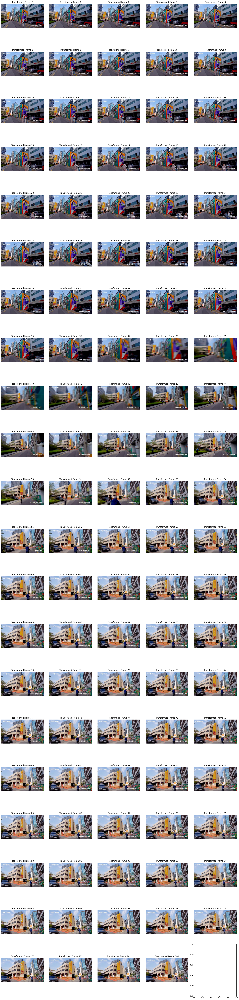

In [41]:
output_folder = "/content/result_frames" # 변환된 프레임을 저장할 폴더 이름
os.makedirs(output_folder, exist_ok=True)

new_ad_path = "/content/ad_image.png" # 광고 이미지 로드
new_ad = cv2.imread(new_ad_path)
new_ad = cv2.cvtColor(new_ad, cv2.COLOR_BGR2RGB)
new_ad = cv2.convertScaleAbs(new_ad, alpha=0.85, beta=0)  # 명암 조정

alpha = 0.9
padding = 10
prev_pts_src = None

# 시각화 설정
num_frames = len(frame_files)
num_cols = 5
num_rows = (num_frames + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 4, num_rows * 4))
axes = axes.flatten()

for frame_idx, frame_path in enumerate(frame_files):
    frame = cv2.imread(frame_path)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    mask_dict = video_segments.get(frame_idx, None) # 마스크 불러오기 및 전처리
    if not mask_dict or len(mask_dict) == 0:
        continue

    mask = np.sum(np.stack(list(mask_dict.values())), axis=0)
    if np.sum(mask) == 0:
        continue

    if mask.ndim == 3:
        mask = np.squeeze(mask, axis=0)
    mask = (mask * 255).astype(np.uint8)

    try:
        corners = get_billboard_corners(mask)  # 꼭짓점 추출
    except ValueError as e:
        continue

    # 꼭짓점이 5개 이상 검출된 경우 이전 프레임 사용
    if len(corners) > 4:
        if prev_pts_src is not None:
            print(f"Frame {frame_idx}: Too many corners, using previous frame data.")
            pts_src = prev_pts_src
        else:
            print(f"Frame {frame_idx}: Too many corners, no previous available. Skipping.")
            continue
    else:
        pts_src, _, _ = calculate_billboard_size_video(corners)
        prev_pts_src = pts_src.copy()

    # 삽입 영역 padding 적용
    pts_src[:, 0] += np.array([-padding, padding, padding, -padding])
    pts_src[:, 1] += np.array([-padding, -padding, padding, padding])

    try:
        frame = insert_new_billboard(frame, pts_src, new_ad, mask, alpha=alpha)
    except Exception as e:
        print(f"Frame {frame_idx}: Insertion failed - {e}")
        continue

    # 결과 저장
    save_path = os.path.join(output_folder, f"frame_{frame_idx:04d}.jpg")
    cv2.imwrite(save_path, cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))

    # 시각화
    axes[frame_idx].imshow(frame)
    axes[frame_idx].set_title(f"Transformed Frame {frame_idx}")
    axes[frame_idx].axis("off")

plt.tight_layout()
plt.show()

In [42]:
# 프레임 -> 동영상으로 변경
frame_folder = "/content/result_frames" # 변환된 프레임이 저장된 폴더 경로

# 프레임 파일 리스트 정렬
frame_files = sorted([os.path.join(frame_folder, f) for f in os.listdir(frame_folder) if f.endswith(".jpg")])

if not frame_files:
    raise ValueError("No image frames found in the extracted folder.")
print(f"Found {len(frame_files)} frames.")

# 첫 번째 프레임 크기 = 기준 크기
first_frame = cv2.imread(frame_files[0])
h, w, _ = first_frame.shape  # 기준 프레임의 높이, 너비 가져옴
print(f"기준 프레임 크기: {w} x {h}")

# 모든 프레임을 동일한 크기로 맞추기
fixed_size = (w, h)
resized_frames = []

for frame_path in frame_files:
    frame = cv2.imread(frame_path)

    if frame.shape[:2] != (h, w):  # 현재 프레임 크기가 기준과 다르면 리사이징
        frame = cv2.resize(frame, fixed_size, interpolation=cv2.INTER_AREA)
    resized_frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
print(f"모든 프레임이 {w}x{h} 크기로 통일됨.")

# 원본 동영상의 FPS
original_video_path = "/content/test video 01.mp4"
video_clip = mp.VideoFileClip(original_video_path)
fps = video_clip.fps
print(f"Original Video FPS: {fps}")

# 이미지 시퀀스를 동영상으로 변환
output_video_path = "output_video.mp4"
video_clip = mp.ImageSequenceClip(resized_frames, fps=fps)
video_clip.write_videofile(output_video_path, codec="libx264", fps=fps)

print(f"Video saved: {output_video_path}")

Found 104 frames.
기준 프레임 크기: 640 x 360
모든 프레임이 640x360 크기로 통일됨.
Original Video FPS: 24.0
Moviepy - Building video output_video.mp4.
Moviepy - Writing video output_video.mp4



Moviepy - Done !
Moviepy - video ready output_video.mp4
Video saved: output_video.mp4
